In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,Lasso,LassoCV,ElasticNet,ElasticNetCV,LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score,confusion_matrix,roc_curve,roc_auc_score
import matplotlib.pyplot as plt
%matplotlib inline
from ydata_profiling import ProfileReport
import seaborn as sns
import pickle


In [6]:
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [7]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [9]:
pf=ProfileReport(df)

In [11]:
pf.to_widgets()

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
df['BMI']=df['BMI'].replace(0,df['BMI'].mean()) #replcing zeroes with mean

In [13]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [15]:
df['BloodPressure']=df['BloodPressure'].replace(0,df['BloodPressure'].mean())

In [16]:
df['Insulin']=df['Insulin'].replace(0,df['Insulin'].mean())

In [17]:
df['Glucose']=df['Glucose'].replace(0,df['Glucose'].mean())

In [18]:
df['SkinThickness']=df['SkinThickness'].replace(0,df['SkinThickness'].mean())

In [20]:
ProfileReport(df) #to check again the distribution after replacing

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

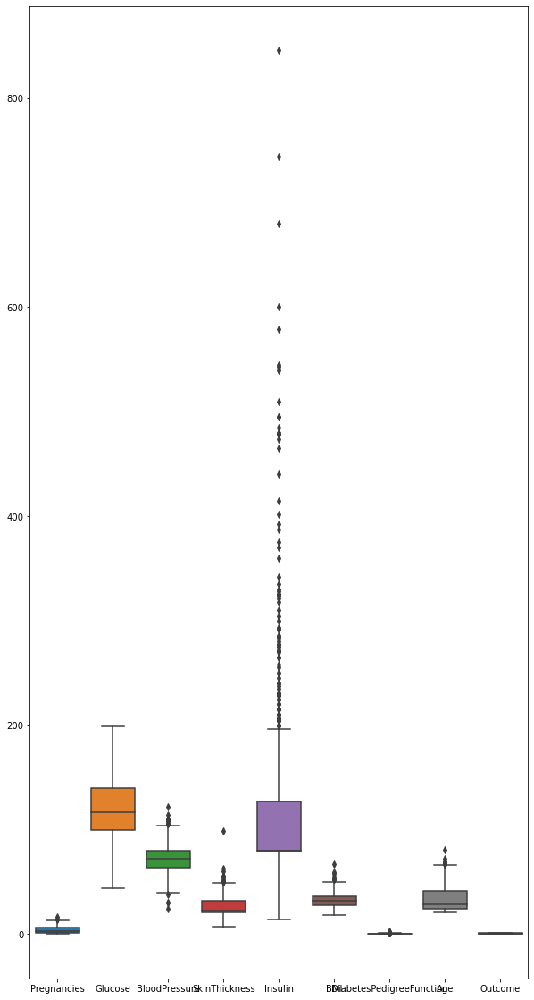

In [22]:
fig,ax=plt.subplots(figsize=(10,20))
sns.boxplot(data=df,ax=ax)

In [27]:
q=df['Insulin'].quantile(0.7) #drop data 30 perc
df_new=df[df['Insulin']<q]

In [28]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
761,9,170.0,74.0,31.000000,79.799479,44.0,0.403,43,1
762,9,89.0,62.0,20.536458,79.799479,22.5,0.142,33,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

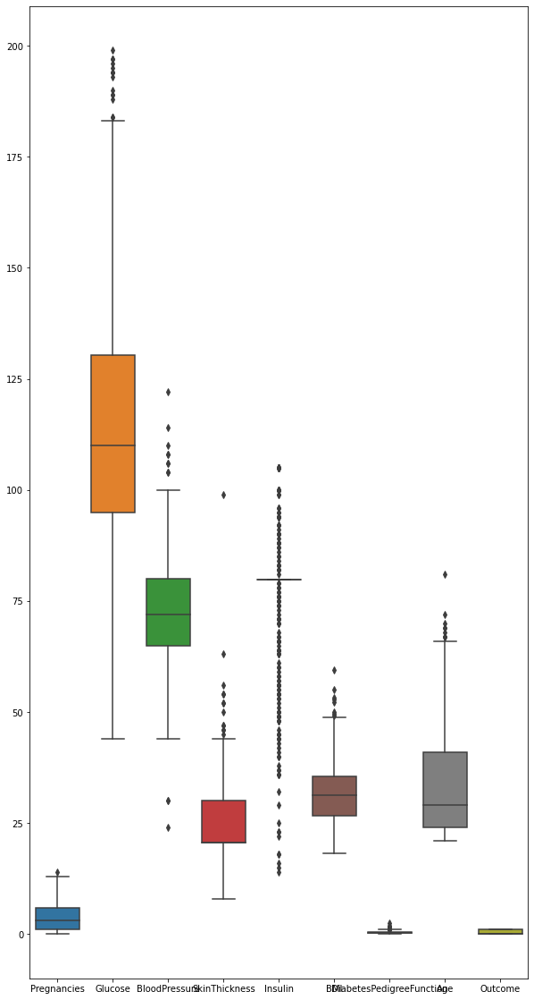

In [30]:
fig,ax=plt.subplots(figsize=(10,20)) #after dropping data 
sns.boxplot(data=df_new,ax=ax)

In [49]:
q=df['Pregnancies'].quantile(0.98) 
df_new=df[df['Pregnancies']<q]

<AxesSubplot:>

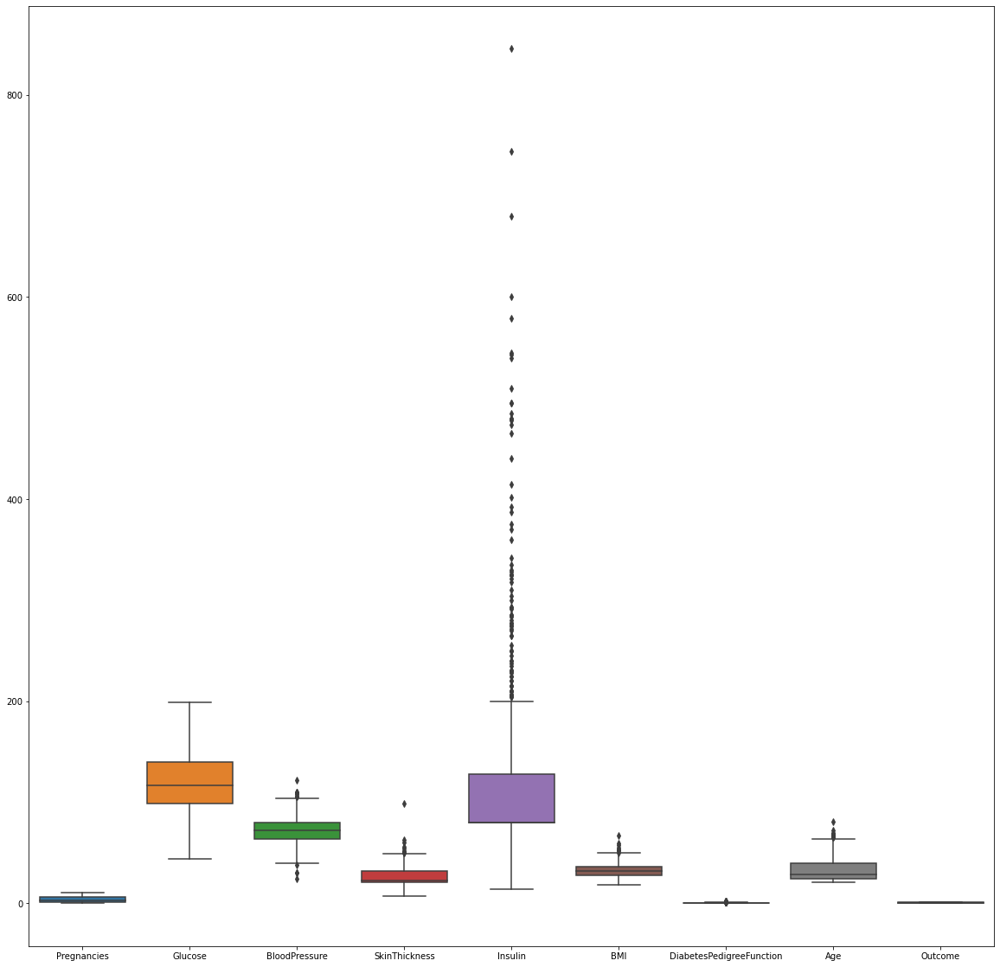

In [50]:
fig,ax=plt.subplots(figsize=(20,20)) #after dropping data 
sns.boxplot(data=df_new,ax=ax)

In [51]:
q=df['BMI'].quantile(0.98) 
df_new=df[df['BMI']<q]

<AxesSubplot:>

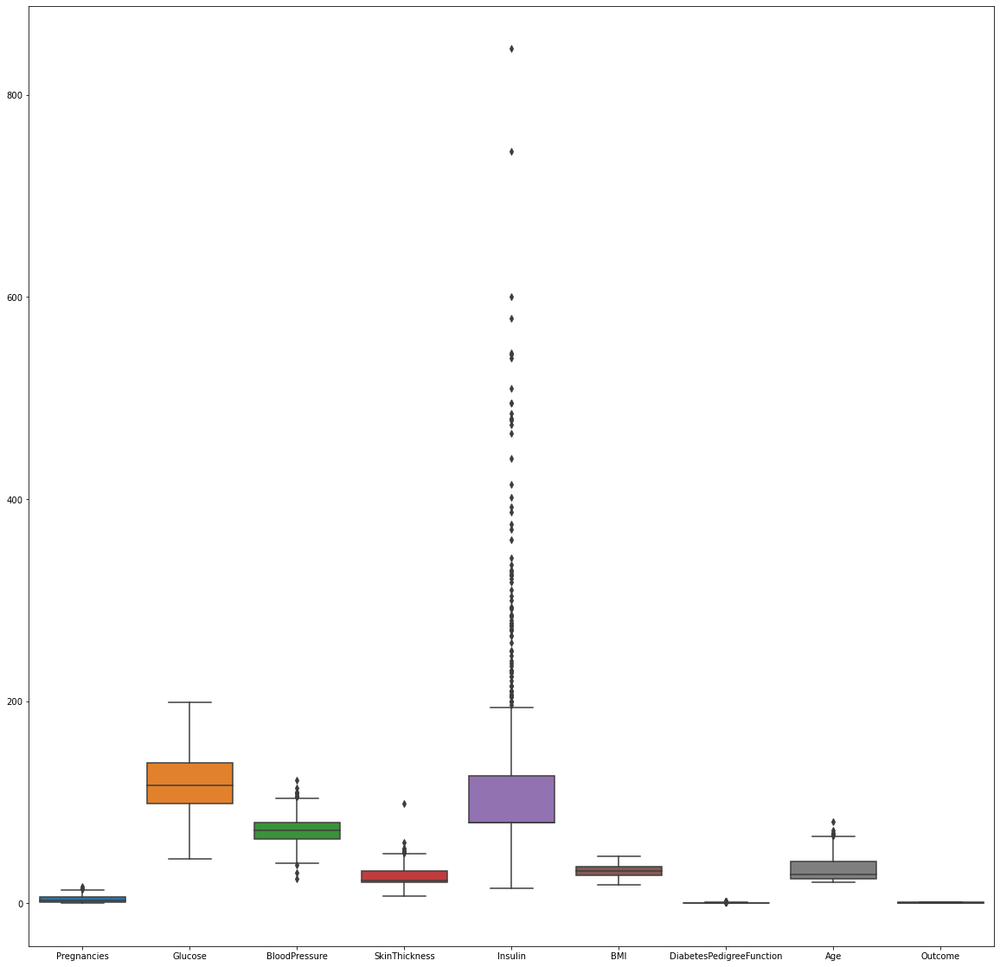

In [52]:
fig,ax=plt.subplots(figsize=(20,20)) #after dropping data 
sns.boxplot(data=df_new,ax=ax)

In [53]:

q = df['SkinThickness'].quantile(.99)
df_new= df[df['SkinThickness']< q]

q = df['Insulin'].quantile(.95)
df_new = df[df['Insulin']< q]

q = df['DiabetesPedigreeFunction'].quantile(.99)
df_new = df[df['DiabetesPedigreeFunction']< q]


q = df['Age'].quantile(.99)
df_new= df[df['Age']< q]

In [62]:
#best way write a function
def outlier_removal(self,data):
    def outlier_limits(col):
        Q3,Q1=np.nanpercentile(col,[75,25])
        IQR=Q3-Q1
        UL=Q3+1.5*IQR
        LL=Q1-1.5*IQR
        return UL,LL
    for column in data.columns:
        if data[column].dtype != 'int64':
           UL,LL=outlier_limits(data[column])
           data[column]=np.where((data)[column]>UL | (data[column]<LL),np.nan,df[column])
    return data
        

In [54]:
y=df_new['Outcome']

In [55]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [61]:
outlier_removal(data=df)

TypeError: Cannot perform 'ror_' with a dtyped [bool] array and scalar of type [bool]

In [88]:
x=df_new.drop(columns="Outcome")

In [89]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [66]:
y=df_new['Outcome']

In [67]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 759, dtype: int64

In [69]:
#as data is fluctuating before splitting 
scaler=StandardScaler()
df1=pd.DataFrame(scaler.fit_transform(df_new))

In [70]:
ProfileReport(df1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

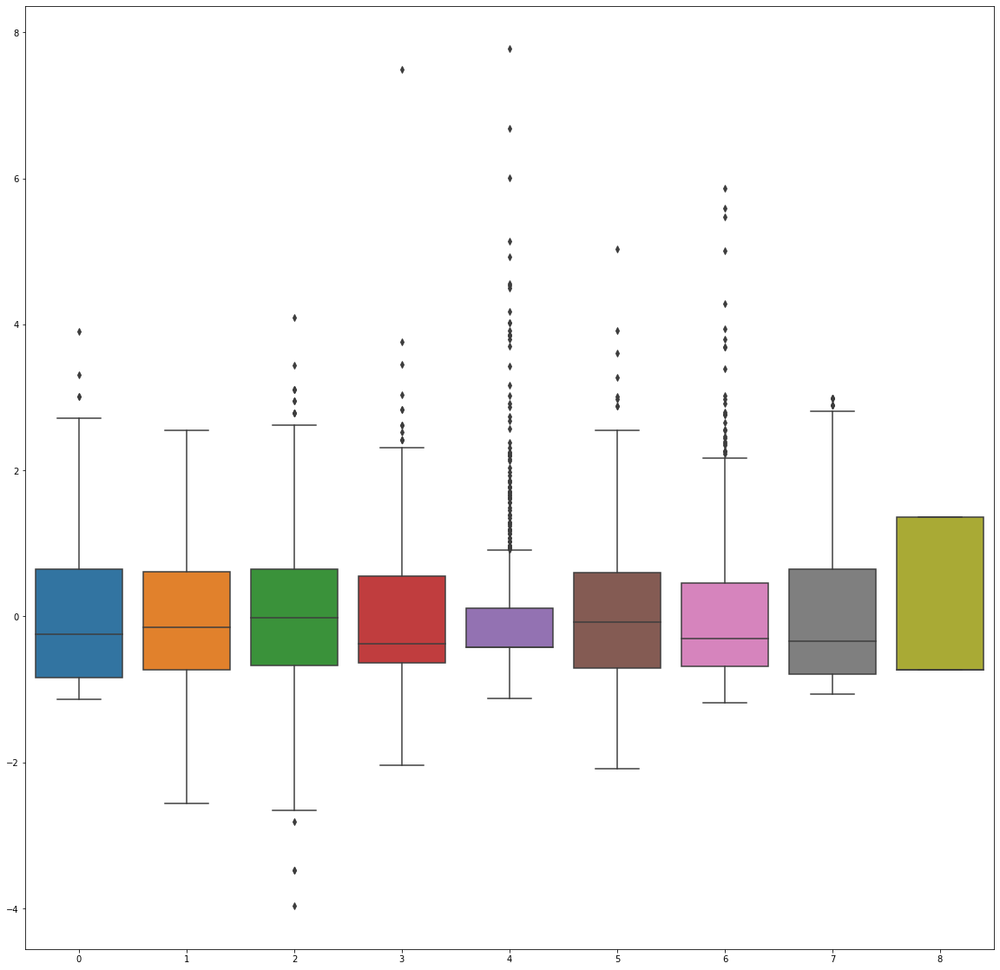

In [72]:
fig,ax=plt.subplots(figsize=(20,20)) #after scaling
sns.boxplot(data=df1,ax=ax)

In [91]:
scaler=StandardScaler()

x_scaled=scaler.fit_transform(x)            

In [92]:
x_scaled

array([[ 0.64327075,  0.87008298, -0.01698412, ...,  0.16090077,
         0.46879263,  1.54828125],
       [-0.83984741, -1.20656984, -0.51093456, ..., -0.85816238,
        -0.36177415, -0.16252742],
       [ 1.23651801,  2.02377899, -0.6755847 , ..., -1.33857787,
         0.60421113, -0.07248486],
       ...,
       [ 0.34664712, -0.01991109, -0.01698412, ..., -0.91639456,
        -0.68075995, -0.25256998],
       [-0.83984741,  0.14490263, -1.00488499, ..., -0.3486308 ,
        -0.36779275,  1.27815356],
       [-0.83984741, -0.9428679 , -0.18163427, ..., -0.30495667,
        -0.47010895, -0.88286791]])

In [93]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])


In [94]:
vif_score(x) #checking multicollinearity

,FEATURE,VIF_SCORE
0,Pregnancies,1.484572
1,Glucose,1.354580
2,BloodPressure,1.247898
3,SkinThickness,1.455095
4,Insulin,1.264776
5,BMI,1.551161
6,DiabetesPedigreeFunction,1.058847
7,Age,1.680199


In [95]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled , y , test_size = .30 , random_state = 144)

In [96]:
x_train

array([[-0.54322378, -1.04175613, -0.34628441, ...,  0.83057085,
         0.09563944, -0.52269766],
       [ 0.64327075,  2.41933191, -0.18163427, ..., -0.23216644,
        -0.43098805, -0.16252742],
       [-0.54322378, -0.67916595, -1.16953514, ..., -1.20755546,
         0.42967173, -0.88286791],
       ...,
       [ 0.64327075,  0.11193988, -0.34628441, ..., -0.36318885,
        -0.02172326, -0.07248486],
       [-0.83984741, -0.7121287 , -0.01698412, ..., -1.04741697,
         0.56208093, -0.4326551 ],
       [ 0.34664712,  2.22155545, -0.6755847 , ..., -0.18849231,
         0.33638343, -0.34261254]])

In [97]:
y_train

38     1
675    1
679    0
766    1
75     0
      ..
649    0
424    1
217    0
446    0
360    1
Name: Outcome, Length: 531, dtype: int64

In [98]:
logr_liblinear = LogisticRegression(verbose=1,solver='liblinear') 
#verbose is like logging
#n_jobs= how many processor used to perform

In [99]:
logr_liblinear.fit(x_train,y_train )

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [102]:
logr_liblinear.predict_log_proba([x_test[1]])

array([[-0.11793086, -2.19604277]])

In [ ]:
logr